<a href="https://colab.research.google.com/github/NoahYe123/ObjectDetection/blob/main/Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **README**

**Authors: Noah/Jian Long Ye (260957565), Abiola Olaniyan (260983951)**

External libraries used for the project were OpenCV, Matplotlib, Numpy, scikitlearn, Pytorch and Google Colab's Python library. The path variable used is *path*; it is currently set to "/content/drive/My Drive/sources".

The report can be found below in the last text cell.

Other sources:
*  https://pyimagesearch.com/2018/07/23/simple-object-tracking-with-opencv/
*  https://github.com/boo13/centroid-tracker/blob/master/tracker/centroidtracker.py
*  https://pypi.org/project/centroid-tracker/#description

In [ ]:
from google.colab import drive
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
from sklearn.cluster import MeanShift, estimate_bandwidth
import sys
import numpy as np
import os
import skimage.io
import torch

# Mount Google Drive
drive.mount('/content/drive')
# Define the path to the "images" folder
path = '/content/drive/My Drive/sources/'

# Check if a GPU is available, and set the device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Set paths for the McGill and St. Catherine dashcam videos
mcgill = path + 'mcgill_drive.mp4'
st_catherines = path + 'st-catherines_drive.mp4'

Mounted at /content/drive


Checking McGill video...


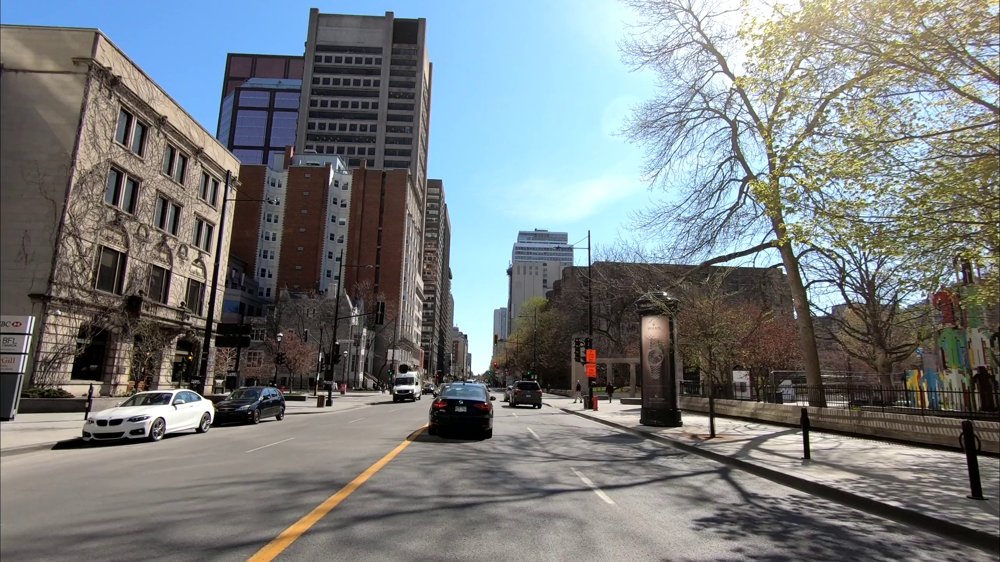

McGill video loaded correctly.

Checking St. Catherine's video...


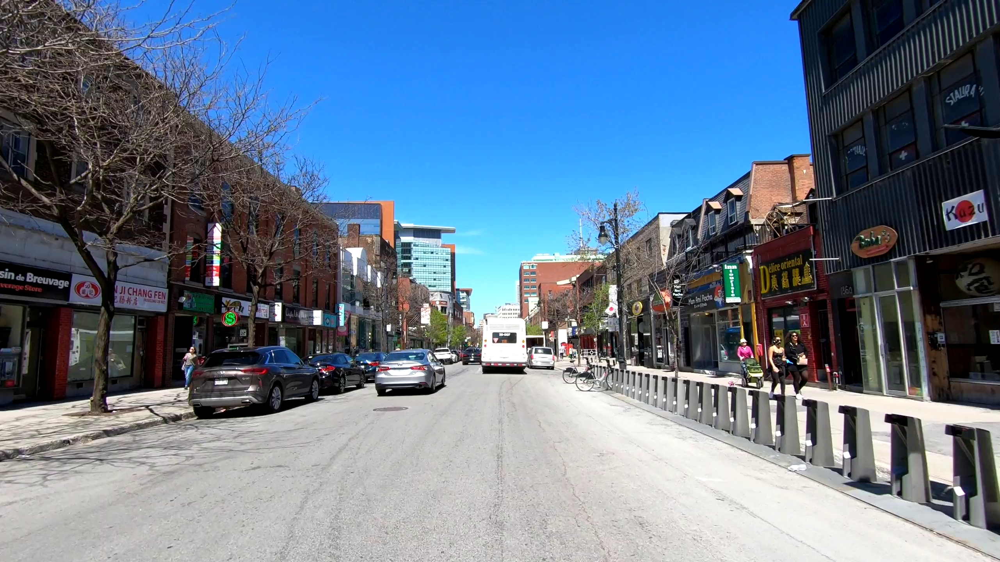

St. Catherine's video loaded correctly.


In [ ]:
# Function to check if a video is loaded correctly
def check_video(video_path):
    # Check if the video file exists
    if not os.path.exists(video_path):
        print(f"Video {video_path} does not exist.")
        return False

    # Create a video capture object
    cap = cv2.VideoCapture(video_path)

    # Try to read the first frame
    ret, frame = cap.read()

    # Check if a frame has been read
    if not ret:
        print(f"Failed to read video: {video_path}")
        return False

    # Display the frame
    cv2_imshow(frame)  # This will display the frame in Google Colab

    # Release the video capture object
    cap.release()

    return True

# Check if the McGill video is loaded correctly
print("Checking McGill video...")
if check_video(mcgill):
    print("McGill video loaded correctly.")

# Check if the St. Catherine's video is loaded correctly
print("\nChecking St. Catherine's video...")
if check_video(st_catherines):
    print("St. Catherine's video loaded correctly.")


In [ ]:
!git clone https://github.com/akTwelve/Mask_RCNN.git
!ls
%cd Mask_RCNN

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 979, done.
remote: Total 979 (delta 0), reused 0 (delta 0), pack-reused 979
Receiving objects: 100% (979/979), 137.72 MiB | 34.39 MiB/s, done.
Resolving deltas: 100% (570/570), done.
drive  Mask_RCNN  sample_data
/content/Mask_RCNN


In [ ]:

''' Note sources used:
https://medium.com/@tibastar/mask-r-cnn-d69aa596761f
https://jonathan-hui.medium.com/image-segmentation-with-mask-r-cnn-ebe6d793272
'''
!pwd

# 1. Implement the pre-trained Mask R-CNN model
# Root directory of the project
ROOT_DIRECTORY = os.getcwd()
# Import Mask RCNN
sys.path.append(ROOT_DIRECTORY)
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize

# Directory to save logs and trained model
MODEL_DIRECTORY = os.path.join(ROOT_DIRECTORY, "logs")

/content/Mask_RCNN


In [ ]:
# For importing coco folder as module
sys.path.append(os.path.join(ROOT_DIRECTORY, "samples/coco/"))
import coco

# Local path to trained weights file
COCO_WEIGHT_PATH = os.path.join(ROOT_DIRECTORY, "mask_rcnn_coco.h5")

# Download COCO trained weights
if not os.path.exists(COCO_WEIGHT_PATH):
    utils.download_trained_weights(COCO_WEIGHT_PATH)

# Loading the model configuration
class InferenceConfig(coco.CocoConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()

... done downloading pretrained model!

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE

In [ ]:
# 2. Display the result that shows the bounding boxes, object classes, and segmentations inside each bounding boxes
# class object taken from https://gist.github.com/SrikarNamburu/0945de8f9a8714ec245dde3443e9d487
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIRECTORY, config=config)

import tensorflow as tf

tf.keras.Model.load_weights(model.keras_model, COCO_WEIGHT_PATH, by_name=True)

street_class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']



Instructions for updating:
Use fn_output_signature instead


In [ ]:
# https://pyimagesearch.com/2018/07/23/simple-object-tracking-with-opencv/
#https://github.com/boo13/centroid-tracker/blob/master/tracker/centroidtracker.py / https://pypi.org/project/centroid-tracker/#description
from scipy.spatial import distance as dist
class CentroidTracker():
    def __init__(self, maxDisappeared=50):
        self.nextObjectID = 0
        self.objects = {}
        self.disappeared = {}
        self.maxDisappeared = maxDisappeared

    def register(self, centroid):
        self.objects[self.nextObjectID] = centroid
        self.disappeared[self.nextObjectID] = 0
        self.nextObjectID += 1

    def deregister(self, objectID):
        del self.objects[objectID]
        del self.disappeared[objectID]

    def update(self, rects):
        # Check if list of input bounding box rectangles is empty
        if len(rects) == 0:
            for objectID in list(self.disappeared.keys()):
                self.disappeared[objectID] += 1
                if self.disappeared[objectID] > self.maxDisappeared:
                    self.deregister(objectID)
            return self.objects

        # Initialize an array of input centroids for the current frame
        inputCentroids = np.zeros((len(rects), 2), dtype="int")
        for (i, (startX, startY, endX, endY)) in enumerate(rects):
            cX = int((startX + endX) / 2.0)
            cY = int((startY + endY) / 2.0)
            inputCentroids[i] = (cX, cY)

        # Register new centroids if no existing objects
        if len(self.objects) == 0:
            for i in range(0, len(inputCentroids)):
                self.register(inputCentroids[i])
        else:
            # Compute distance between existing objects and new centroids
            objectIDs = list(self.objects.keys())
            objectCentroids = list(self.objects.values())
            D = dist.cdist(np.array(objectCentroids), inputCentroids)

            # Find smallest value in each row and sort the row indexes
            rows = D.min(axis=1).argsort()

            # Find smallest value in each column and sort using previously computed row index list
            cols = D.argmin(axis=1)[rows]

            usedRows = set()
            usedCols = set()

            # Associate existing object centroids with new centroids
            for (row, col) in zip(rows, cols):
                if row in usedRows or col in usedCols:
                    continue

                objectID = objectIDs[row]
                self.objects[objectID] = inputCentroids[col]
                self.disappeared[objectID] = 0

                usedRows.add(row)
                usedCols.add(col)

            # Check for unassociated centroids and update disappeared counter
            unusedRows = set(range(0, D.shape[0])).difference(usedRows)
            unusedCols = set(range(0, D.shape[1])).difference(usedCols)

            for row in unusedRows:
                objectID = objectIDs[row]
                self.disappeared[objectID] += 1

                if self.disappeared[objectID] > self.maxDisappeared:
                    self.deregister(objectID)

            for col in unusedCols:
                self.register(inputCentroids[col])

        return self.objects



def count_objects(video_path, movement_threshold):
    video = cv2.VideoCapture(video_path)
    frame_skip = 3
    ct_pedestrians = CentroidTracker(maxDisappeared=frame_skip)  # Tracker for pedestrians
    ct_cars = CentroidTracker(maxDisappeared=frame_skip)  # Tracker for cars
    unique_pedestrians = set()
    unique_cars = set()
    car_positions = {}  # Dictionary to track the position of each car
    moving_cars = set()
    parked_cars = set()
    frame_count = 0
    resize_width = 500


    while video.isOpened():
        ret, frame = video.read()
        if not ret:
            break

        frame = cv2.resize(frame, (resize_width, int(frame.shape[0] * (resize_width / frame.shape[1]))))

        if frame_count % frame_skip == 0:
            results = model.detect([frame], verbose=0)
            r = results[0]

            rects_pedestrians = []
            rects_cars = []
            for i in range(0, len(r['rois'])):
                if r['class_ids'][i] == street_class_names.index('person'):
                    (startY, startX, endY, endX) = r['rois'][i]
                    rects_pedestrians.append((startX, startY, endX, endY))
                elif r['class_ids'][i] == street_class_names.index('car'):
                    (startY, startX, endY, endX) = r['rois'][i]
                    rects_cars.append((startX, startY, endX, endY))

            # Update our centroid trackers
            objects_pedestrians = ct_pedestrians.update(rects_pedestrians)
            objects_cars = ct_cars.update(rects_cars)

            # Add the new unique object IDs to the sets for pedestrians and cars
            for objectID in objects_pedestrians.keys():
                unique_pedestrians.add(objectID)
            for objectID, new_centroid in objects_cars.items():
                unique_cars.add(objectID)
                if objectID not in car_positions:
                    car_positions[objectID] = [new_centroid]
                else:
                    car_positions[objectID].append(new_centroid)
                    # Check if the car has moved significantly
                    if len(car_positions[objectID]) > 1:  # Ensure there are at least 2 points to compare
                        dist_moved = dist.euclidean(car_positions[objectID][-1], car_positions[objectID][-2])
                        if dist_moved > movement_threshold:  # movement_threshold is a set value to determine movement
                            moving_cars.add(objectID)
                        else:
                            parked_cars.add(objectID)
        print(f"Pedestrians: {len(unique_pedestrians)}, Unique cars: {len(unique_cars)}, Parked Cars: {len(parked_cars)}, Moving Cars: {len(moving_cars)}")

        frame_count += 1

    video.release()
    return len(unique_pedestrians), len(unique_cars), len(moving_cars), len(parked_cars)


In [ ]:
# McGill Drive
mcgill_pedestrians, mcgill_cars, mcgill_moving_cars, mcgill_parked_cars = count_objects(mcgill,1)
print(f"Total number of unique pedestrians in McGill video: {mcgill_pedestrians}")
print(f"Total number of unique cars in McGill video: {mcgill_cars}")
print(f"Number of moving cars in McGill video: {mcgill_moving_cars}")
print(f"Number of parked cars in McGill video: {mcgill_parked_cars}")



/usr/local/lib/python3.10/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Pedestrians: 0, Unique cars: 4, Parked Cars: 0, Moving Cars: 0
Pedestrians: 0, Unique cars: 4, Parked Cars: 0, Moving Cars: 0
Pedestrians: 0, Unique cars: 4, Parked Cars: 0, Moving Cars: 0
Pedestrians: 1, Unique cars: 5, Parked Cars: 3, Moving Cars: 1
Pedestrians: 1, Unique cars: 5, Parked Cars: 3, Moving Cars: 1
Pedestrians: 1, Unique cars: 5, Parked Cars: 3, Moving Cars: 1
Pedestrians: 2, Unique cars: 7, Parked Cars: 4, Moving Cars: 1
Pedestrians: 2, Unique cars: 7, Parked Cars: 4, Moving Cars: 1
Pedestrians: 2, Unique cars: 7, Parked Cars: 4, Moving Cars: 1
Pedestrians: 2, Unique cars: 9, Parked Cars: 7, Moving Cars: 1
Pedestrians: 2, Unique cars: 9, Parked Cars: 7, Moving Cars: 1
Pedestrians: 2, Unique cars: 9, Parked Cars: 7, Moving Cars: 1
Pedestrians: 2, Unique cars: 10, Parked Cars: 9, Moving Cars: 5
Pedestrians: 2, Unique cars: 10, Parked Cars: 9, Moving Cars: 5
Pedestrians: 2, Unique cars: 10, Parked Cars: 9, Moving Cars: 5
Pedestrians: 2, Unique cars: 10, Parked Cars: 10, Mo

In [ ]:
# St Catherines Drive
catherines_pedestrians, catherines_cars, catherines_moving_cars, catherines_parked_cars = count_objects(st_catherines,1)
print(f"Total number of unique pedestrians in McGill video: {catherines_pedestrians}")
print(f"Total number of unique cars in McGill video: {catherines_cars}")
print(f"Number of moving cars in McGill video: {catherines_moving_cars}")
print(f"Number of parked cars in McGill video: {catherines_parked_cars}")

Pedestrians: 3, Unique cars: 8, Parked Cars: 0, Moving Cars: 0
Pedestrians: 3, Unique cars: 8, Parked Cars: 0, Moving Cars: 0
Pedestrians: 3, Unique cars: 8, Parked Cars: 0, Moving Cars: 0
Pedestrians: 4, Unique cars: 8, Parked Cars: 4, Moving Cars: 4
Pedestrians: 4, Unique cars: 8, Parked Cars: 4, Moving Cars: 4
Pedestrians: 4, Unique cars: 8, Parked Cars: 4, Moving Cars: 4
Pedestrians: 5, Unique cars: 8, Parked Cars: 6, Moving Cars: 5
Pedestrians: 5, Unique cars: 8, Parked Cars: 6, Moving Cars: 5
Pedestrians: 5, Unique cars: 8, Parked Cars: 6, Moving Cars: 5
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 6, Unique cars: 8, Parked Cars: 6, Moving Cars: 6
Pedestrians: 7, Unique cars: 8, Parked Cars: 6, Moving 

##**Report**
**Authors: Noah/Jian Long Ye (260957565) and Abiola Olaniyan (260983951)**
###**Overall Approach**
> Our overall approach consisted of first understanding the task we needed to accomplish with our Python program (i.e. detecting pedestrians and parked/moving cars), prior to brainstorming or researching any articles that could help simplify the process of the project. Once we had compiled sources that we could use for the actual code, we then laid out a structure of steps we would follow in the various notebook cells, before tackling each step sequentially (making modifications as we went along or discovered new things with the code). The following is the structure summarized step-by-step:

1. Read/load the videos using OpenCV's functions
2. Implement a pre-trained Mask R-CNN model and configure it using COCO (dataset and weights)
3. Build a main method responsible for counting the number of pedestrians and cars frame-by-frame
4. Call that method on both input dashcam videos and display the results in the console

> Specific routines did require some additional tweaking after they were implemented; for example, the thresholds for movement input to the main method when differentiating between moving and parked cars for both videos required trial and error until we were satisfied.


###**Software/Packages Used**
> The libraries we primarily used were OpenCV, Tensorflow, and external packages found on Github for Mask R-CNN and a centroid tracker. The majority of computations take place in our main method *count_objects(...)* which takes as parameters the absolute path of the video being analyzed and a threshold value for moving car detection:

* OpenCV was used to capture the analyzed videos (McGill and St. Catherine street dashcam), by reading its frames separately so that the detection model can perform work on them.
* The Mask R-CNN model portion of the code is taken from the previous assignments to ease that specific step of the main method; the model is initialized to be in "inference mode" which offers the ability to form predictions on the data we have. The COCO dataset has multiple class names but the ones we needed to index were 'person' and 'car'.
* The CentroidTracker class tracks objects in subsequent frames by associating their centroids. It uses Euclidean distance to match existing objects with new centroids while updating object positions and handling appearances and disappearances. The algorithm maintains a dictionary of object IDs, centroids, and disappearance counters.

> To summarize the main method, we first create trackers for both cars and pedestrians, and sets to store unique IDs assigned. Once we detect objects in the frame using the model, we extract bounding box coordinates, update the trackers with them, increment any counters for the cars and people before updating frames.


###**Summary of Program Output**
> For the McGill dashcam video, the program detected 193 pedestrians, 92 moving cars and 129 parked cars. In the St. Catherine video, our program detected 351 pedestrians, 172 moving cars and 229 parked cars. Compared to manually obtained ground truth values (which are subject to our human error), these are larger than they likely should be as will be explained in the next section.

###**Discussion of Program Performance and Problems**
> Concerning performance, the program sets up quickly and is able to complete counting for the required objects in the videos within 3-4 minutes when using the T4 GPU provided by Google Colab. One problem that we identified after writing the script is the large difference between the number of objects we observed for certain classes versus what is detected by the program. This could be because our program was not properly set up to uniquely identify different class objects, and instead may be recounting them each frame. For example, this may be why in certain instances of moving car detection, the amount is incremented in the next frame by a number bigger than it should be. Another potential issue is the usage of frame skipping; although we tried various values to improve performance, skipping frames can lead to missed detections and greater inaccuracy.



